In [1]:
# Import PySTAC Client
from pystac_client import Client

In [2]:
# Connect to the catalog
catalog = Client.open('https://earth-search.aws.element84.com/v1/')
catalog

<Client id=earth-search-aws>

In [29]:
# Get collections
collections = catalog.get_collections()
collections

<generator object Client.get_collections at 0x7f1c57a05fc0>

In [30]:
# Get the first collection
collection = next(collections)
collection

<CollectionClient id=sentinel-2-pre-c1-l2a>

In [31]:
# Display collection ids
for collection in collections:
    print(collection.id)

cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd


In [32]:
# Get collection with a specific id
collection = catalog.get_collection('sentinel-2-l2a')
collection

<CollectionClient id=sentinel-2-l2a>

In [33]:
# Get items in the collection
items = collection.get_items()
items

<generator object CollectionClient.get_items at 0x7f1c57a04430>

In [34]:
# Get the first item
item = next(items)
item

<Item id=S2B_23CNM_20241202_0_L2A>

In [36]:
# Get item with a specific id
item = collection.get_item('S2B_3UXV_20241124_0_L2A')
#item = collection.get_item('LC09_L2SP_062046_20241130_20241201_02_T1_ST')
item

<Item id=S2B_3UXV_20241124_0_L2A>

In [37]:
# It is better to use search functionality to get specific items
# Note: Empty search will return all items in all collections.
# Note: Search is lazy, i.e. does not retrieve metadata unless required.
results = catalog.search()

In [38]:
# Display number of items matching the search query
# Note: There are ore then 105 million items in the catalog!
results.matched()

105640958

In [39]:
# Get the first item
item = next(results.items())
item

<Item id=S1A_IW_GRDH_1SDH_20241202T090943_20241202T091008_056811_06F97B>

In [40]:
# Add collection criterion to reduce the number of matches
results = catalog.search(
    #collections=['sentinel-2-l2a']
    collections=['sentinel-2-c1-l2a']
)

In [41]:
results.matched()

21019854

In [42]:
# Define an area of interest (AOI) for spatial filtering
# Note: It is a GeoJSON dictionary for a point. It is possible to use others as well, e.g. polygon
# Note: You can use https://geojson.io to draw features and get corresponding GeoJSON.
aoi = {
    "coordinates": [
     38.999828180955156,-6.421504885922214
    ],
    "type": "Point"
}

In [43]:
# Refine AOI
# Note: 5 digits is enough for ~1 m accuracy.
aoi = {
    "coordinates": [38.99982, -6.42150],
    "type": "Point"
}

In [45]:
# Add spatial criterion to reduce the number of matches
results = catalog.search(
    collections=['sentinel-2-c1-l2a'],
    intersects=aoi,
)

In [46]:
results.matched()

365

In [47]:
# Add date range criterion to reduce the number of matches
# Note: You can also specify a date, a partial date (e.g. 2024), or range of partial dates.
# results = catalog.search(
#     collections=['sentinel-2-l2a'],
#     intersects=aoi,
#     datetime=['2018-12-01', '2018-12-30'],  # ['2024']  ['2024-06']
# )

results = catalog.search(
     collections=['sentinel-2-l2a'],
     intersects=aoi,
     datetime=['2024-06-01', '2024-06-30'],  # ['2024']  ['2024-06']
)



In [48]:
results.matched()

6

In [49]:
# Get items
# Note: Does not return a generator, so all metadata needs to be retrieved. For many items this make take time.
items = results.item_collection()
items

In [50]:
# Sort items by date
# Note: For more information see https://pystac-client.readthedocs.io/en/stable/usage.html#sort-extension
results = catalog.search(
    collections=['sentinel-2-l2a'],
    intersects=aoi,
    datetime=['2024-06-01', '2024-06-30'],
    sortby='properties.datetime',
)

In [51]:
items = results.item_collection()
items

In [52]:
# Get the first item (now the oldest in the specified date range as it is sorted in ascending order by datetime)
item = items[1]
item

<Item id=S2A_37MDN_20240608_0_L2A>

In [53]:
# Display item datetime
item.datetime

datetime.datetime(2024, 6, 8, 7, 51, 56, 725000, tzinfo=tzutc())

In [54]:
# Display item bounding box
item.bbox

[38.09366384102202,
 -7.325735423883312,
 39.088418599591584,
 -6.3317206341458965]

In [55]:
# Display item geometry
item.geometry

{'type': 'Polygon',
 'coordinates': [[[38.09553082328002, -6.3317206341458965],
   [38.09366384102202, -7.3248315240753],
   [39.088418599591584, -7.325735423883312],
   [39.08823643412424, -6.33250094204297],
   [38.09553082328002, -6.3317206341458965]]]}

In [56]:
# Import GeoPandas to quickly display items on a map
import geopandas
import matplotlib.pyplot as plt
from mapclassify import classify 
from matplotlib import colors

In [57]:
# Create geodataframe from items
gdf = geopandas.GeoDataFrame.from_features(items)

In [58]:
gdf

,geometry,created,platform,constellation,instruments,eo:cloud_cover,proj:epsg,mgrs:utm_zone,mgrs:latitude_band,mgrs:grid_square,...,s2:datastrip_id,s2:granule_id,s2:reflectance_conversion_factor,datetime,s2:sequence,earthsearch:s3_path,earthsearch:payload_id,earthsearch:boa_offset_applied,processing:software,updated
0,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-03T11:49:42.794Z,sentinel-2b,sentinel-2,[msi],33.117980,32737,37,M,DN,...,S2B_OPER_MSI_L2A_DS_2BPS_20240603T094932_S2024...,S2B_OPER_MSI_L2A_TL_2BPS_20240603T094932_A0378...,0.973029,2024-06-03T07:51:52.616000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/3ee4...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-03T11:49:42.794Z
1,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-08T13:45:28.713Z,sentinel-2a,sentinel-2,[msi],22.796886,32737,37,M,DN,...,S2A_OPER_MSI_L2A_DS_2APS_20240608T113207_S2024...,S2A_OPER_MSI_L2A_TL_2APS_20240608T113207_A0468...,0.971560,2024-06-08T07:51:56.725000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/fb2d...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-08T13:45:28.713Z
2,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-14T14:42:42.537Z,sentinel-2b,sentinel-2,[msi],0.881941,32737,37,M,DN,...,S2B_OPER_MSI_L2A_DS_2BPS_20240613T094853_S2024...,S2B_OPER_MSI_L2A_TL_2BPS_20240613T094853_A0379...,0.970300,2024-06-13T07:51:54.088000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/846b...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-14T14:42:42.537Z
3,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-18T13:49:24.609Z,sentinel-2a,sentinel-2,[msi],93.459731,32737,37,M,DN,...,S2A_OPER_MSI_L2A_DS_2APS_20240618T112345_S2024...,S2A_OPER_MSI_L2A_TL_2APS_20240618T112345_A0469...,0.969257,2024-06-18T07:51:56.451000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/d9a9...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-18T13:49:24.609Z
4,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-29T05:41:51.349Z,sentinel-2b,sentinel-2,[msi],32.934931,32737,37,M,DN,...,S2B_OPER_MSI_L2A_DS_2BPS_20240623T095506_S2024...,S2B_OPER_MSI_L2A_TL_2BPS_20240623T095506_A0381...,0.968437,2024-06-23T07:51:53.741000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/ac6a...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-29T05:41:51.349Z
5,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-29T17:44:16.154Z,sentinel-2a,sentinel-2,[msi],39.041585,32737,37,M,DN,...,S2A_OPER_MSI_L2A_DS_2APS_20240628T115550_S2024...,S2A_OPER_MSI_L2A_TL_2APS_20240628T115550_A0470...,0.967845,2024-06-28T07:51:53.711000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/d7c5...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-29T17:44:16.154Z


In [59]:
# Display map of items
# Note: No background layer is visible, because no CRS information was provided.
gdf.explore()

In [60]:
# Recreate geodataframe with CRS information
gdf = geopandas.GeoDataFrame.from_features(items, crs="epsg:4326")
# 4326

In [61]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [62]:
# Display map of items
# Display only the first item on the map
gdf[0:1].explore()

In [63]:
# List assets of the item
item.assets

{'aot': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/AOT.tif>,
 'blue': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B02.tif>,
 'coastal': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B01.tif>,
 'granule_metadata': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/granule_metadata.xml>,
 'green': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B03.tif>,
 'nir': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B08.tif>,
 'nir08': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0

In [64]:
# Get URL address of the thumbnail image
url = item.assets['thumbnail'].href
url

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/thumbnail.jpg'

In [66]:
# Add cloud cover less than 5% criterio
# Note: For more information see https://pystac-client.readthedocs.io/en/stable/usage.html#sort-extension
results = catalog.search(
    collections=['sentinel-2-c1-l2a'],
    intersects=aoi,
    datetime=['2024-06-01', '2024-06-30'],
    query=['eo:cloud_cover<5'],
    sortby='properties.datetime',
)

In [67]:
results.matched()

1

In [68]:
# Get items
items = results.item_collection()
items

In [69]:
# Map items
gdf = geopandas.GeoDataFrame.from_features(items, crs="epsg:4326")

In [71]:
gdf.explore()

In [72]:
# Get the first item
item = items[0]
item

<Item id=S2B_T37MDN_20240613T074428_L2A>

In [73]:
# Get URL address of the thumbnail image
url = item.assets['thumbnail'].href
url

'https://e84-earth-search-sentinel-data.s3.us-west-2.amazonaws.com/sentinel-2-c1-l2a/37/M/DN/2024/6/S2B_T37MDN_20240613T074428_L2A/L2A_PVI.jpg'

In [74]:
# Display thumbnail image inside the notebook
from IPython.display import Image

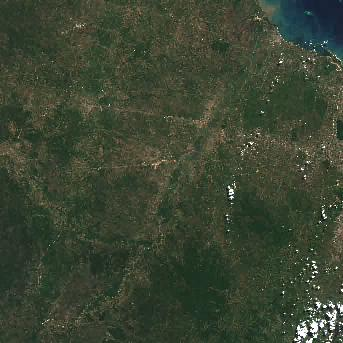

In [75]:
Image(url)

In [76]:
# Download the thumbnail image as 'thumbnail.jpg'
import urllib.request
urllib.request.urlretrieve(url, "thumbnail.jpg")

('thumbnail.jpg', <http.client.HTTPMessage at 0x7f1c0cd98c70>)

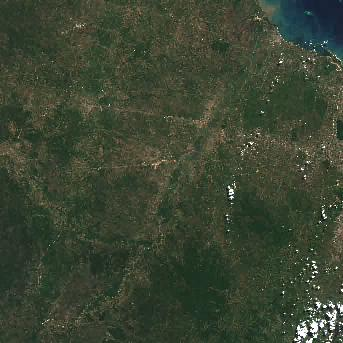

In [77]:
# You can display the local copy as well
Image('thumbnail.jpg')

In [78]:
# Get URL address of the near-infrared asset
# Note: You can download the image locally by clicking the link
url = item.assets['nir'].href
url

'https://e84-earth-search-sentinel-data.s3.us-west-2.amazonaws.com/sentinel-2-c1-l2a/37/M/DN/2024/6/S2B_T37MDN_20240613T074428_L2A/B08.tif'

In [79]:
# Download near-infrared image as 'B08.tif'
urllib.request.urlretrieve(url, "B08.tif")

('B08.tif', <http.client.HTTPMessage at 0x7f1c0cd98790>)

In [80]:
# Open the image by using rasterio
# Note: It will only read metadata to open the image, not the data.
import rasterio 

src = rasterio.open(url, 'r')
src

<open DatasetReader name='https://e84-earth-search-sentinel-data.s3.us-west-2.amazonaws.com/sentinel-2-c1-l2a/37/M/DN/2024/6/S2B_T37MDN_20240613T074428_L2A/B08.tif' mode='r'>

In [81]:
# Display image dimensions
src.shape

(10980, 10980)

In [82]:
# Display image bounds
src.bounds

BoundingBox(left=399960.0, bottom=9190240.0, right=509760.0, top=9300040.0)

In [83]:
# Display image transform
src.transform

Affine(10.0, 0.0, 399960.0,
       0.0, -10.0, 9300040.0)

In [84]:
# Display image CRS
# Note: It is UTM Zone 32N; hence, it is different from the geometry of the item, which is geographic.
src.crs

CRS.from_epsg(32737)

In [85]:
# Display image indexes
src.indexes

(1,)

In [86]:
# Read the data
# Note: This will read all data; hence, it needs to download all of it, which takes time.
# Note: We can prevent this by reading only the data we need.
data = src.read(1)

In [87]:
# Import RasterIO Window to be able to specify the area we are interested in for reading
from rasterio.windows import Window

In [88]:
# Set window as column 0, row 0, width 500, height 500.
window = Window(0, 0, 500, 500)

In [89]:
# Read data using the window
# Note: It will only read the block(s) overlaping with the window; hence, it will be fast - especially if the window is small
data = src.read(1, window=window)

In [90]:
# Display data
# Note: It is 16 bit unsinged integer, which needs to be scaled to get the actual reflectance
# Question: Why they didn't provide reflectance values directly?
data

array([[3554, 3454, 3554, ..., 3658, 3698, 3698],
       [3398, 3398, 3380, ..., 3950, 3642, 3640],
       [3666, 3416, 3316, ..., 4078, 3896, 3740],
       ...,
       [4208, 4688, 4576, ..., 3842, 3834, 3986],
       [4164, 4384, 4152, ..., 3812, 3924, 4144],
       [4002, 3808, 3718, ..., 3776, 3792, 4040]], dtype=uint16)

In [91]:
# Get asset information
asset = item.assets['nir']
asset

<Asset href=https://e84-earth-search-sentinel-data.s3.us-west-2.amazonaws.com/sentinel-2-c1-l2a/37/M/DN/2024/6/S2B_T37MDN_20240613T074428_L2A/B08.tif>

In [92]:
# Get band information from the asset
band = asset.ext.raster.bands[0]
band

<Raster Band>

In [93]:
# Scale data according to the band scale and offset information
scaled_data = data * band.scale + band.offset
scaled_data

array([[0.2554, 0.2454, 0.2554, ..., 0.2658, 0.2698, 0.2698],
       [0.2398, 0.2398, 0.238 , ..., 0.295 , 0.2642, 0.264 ],
       [0.2666, 0.2416, 0.2316, ..., 0.3078, 0.2896, 0.274 ],
       ...,
       [0.3208, 0.3688, 0.3576, ..., 0.2842, 0.2834, 0.2986],
       [0.3164, 0.3384, 0.3152, ..., 0.2812, 0.2924, 0.3144],
       [0.3002, 0.2808, 0.2718, ..., 0.2776, 0.2792, 0.304 ]])

In [94]:
# Plot data
# Note: It is nice to read a small area, but it is an arbitrary area. We need to find a way to read a specific area.
import rasterio.plot

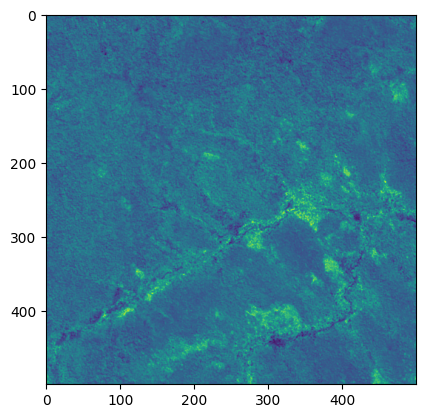

<Axes: >

In [95]:
rasterio.plot.show(scaled_data)

In [96]:
# Import Shapely to enable designation of a custom area by providing corresponding window
# Note: We need some preprocessing, as the CRS of the image is UTM.
import shapely

In [97]:
# Define area of interest polygon as GeoJSON string
aoi = '''
{
   "coordinates": [
          [
            [
              38.5513639024837,
              -6.386527687031872
            ],
            [
              38.5513639024837,
              -6.712371750140903
            ],
            [
              39.035604148587,
              -6.712371750140903
            ],
            [
              39.035604148587,
              -6.386527687031872
            ],
            [
              38.5513639024837,
              -6.386527687031872
            ]
          ]
        ],
    "type": "Polygon"
}
'''

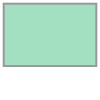

In [98]:
# Create feature
feature = shapely.from_geojson(aoi)
feature

In [99]:
# Get feature bounds
feature.bounds

(38.5513639024837, -6.712371750140903, 39.035604148587, -6.386527687031872)

In [100]:
print("Raster size:", src.width, src.height)

Raster size: 10980 10980


In [101]:
 # Get raster bounds (extent)
bounds = src.bounds
print("Raster Bounds:", bounds)

    # Get raster CRS (coordinate reference system)
crs = src.crs
print("Raster CRS:", crs)

Raster Bounds: BoundingBox(left=399960.0, bottom=9190240.0, right=509760.0, top=9300040.0)
Raster CRS: EPSG:32737


In [102]:
# Import PyPROJ to enable projection of geographic coordinates to UTM
import pyproj

In [103]:
# Convert bounds to UTM
bounds = pyproj.Proj(src.crs).transform_bounds(*feature.bounds)
bounds

(450385.29283641314, 9258024.558496177, 503937.4268014493, 9294067.506821131)

In [104]:
from pyproj import Transformer

# Define the source and target CRS
transformer = Transformer.from_crs("EPSG:4326", "EPSG:32737", always_xy=True)

# Feature bounds in EPSG:4326
feature_bounds = (39.46645367167946, -6.3902243593017545, 39.558530262133075, -6.327112280585553)

# Transform bounds
xmin, ymin = transformer.transform(feature_bounds[0], feature_bounds[1])  # Bottom-left corner
xmax, ymax = transformer.transform(feature_bounds[2], feature_bounds[3])  # Top-right corner

# Converted bounds
utm_bounds = (xmin, ymin, xmax, ymax)
print("UTM Bounds:", utm_bounds)

UTM Bounds: (551584.8260619293, 9293635.499240909, 561775.3432232569, 9300602.327247009)


In [105]:
# Create window from projected bounds by using the transformation of the image
import rasterio.windows

In [106]:
window = rasterio.windows.from_bounds(*bounds, src.transform)
window

Window(col_off=5042.529283641314, row_off=597.2493178867735, width=5355.213396503619, height=3604.294832495507)

In [107]:
# Read data from the raster using the window
data = src.read(1, window=window)

# Check the shape of the data
print("Data shape:", data.shape)

Data shape: (3604, 5355)


In [108]:
data = src.read(1, window=window)

In [109]:
# Read the area of interest
# Note: No scaling for demonstration purposes, you can do it by yourself
data

array([[3438, 3348, 3604, ..., 1182, 1178, 1178],
       [3720, 3742, 3932, ..., 1171, 1160, 1163],
       [4068, 3888, 4042, ..., 1163, 1163, 1152],
       ...,
       [3759, 3780, 3739, ..., 2391, 2458, 2405],
       [3850, 3841, 3815, ..., 2294, 2386, 2680],
       [3912, 3973, 3985, ..., 2595, 2944, 3270]], dtype=uint16)

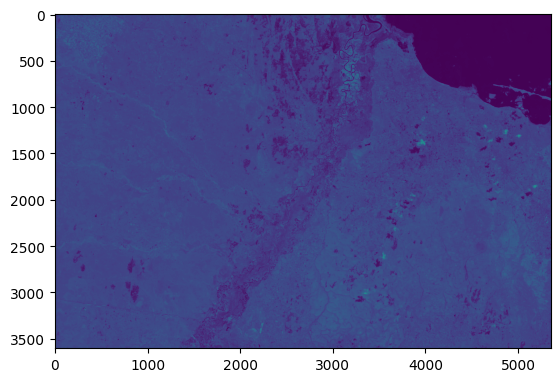

<Axes: >

In [110]:
# Display data
rasterio.plot.show(data)

In [111]:
# Store data
# Note: You should set crs and transform correctly. Using src.transform directly won't work, because it is for the whole image, not the specific area
with rasterio.open(
    'B08_ITC.tif',
    'w',
    driver='GTiff',
    height=data.shape[0],
    width=data.shape[1],
    count=1,
    dtype=data.dtype,
    crs=src.crs,
    transform=rasterio.windows.transform(window, src.transform),
) as dst:
    dst.write(data, 1)

In [112]:
src.meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0.0,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS.from_epsg(32737),
 'transform': Affine(10.0, 0.0, 399960.0,
        0.0, -10.0, 9300040.0)}

In [113]:
print("Number of bands:", src.count)  # Prints the total number of bands

Number of bands: 1


#### I fail to continue, since I am getting only one band

# I am using stack, I left other issues on top

In [114]:
!pip install stackstac

Defaulting to user installation because normal site-packages is not writeable


In [115]:
import stackstac

In [116]:
stack = stackstac.stack(items, assets=['red', 'green', 'blue'], epsg=32737)

In [117]:
stack

<xarray.DataArray 'stackstac-d2c5d6543bace4bc4e48e7403fa65792' (time: 1,
                                                                band: 3,
                                                                y: 10980,
                                                                x: 10980)> Size: 3GB
dask.array<fetch_raster_window, shape=(1, 3, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/59)
  * time                                     (time) datetime64[ns] 8B 2024-06...
    id                                       (time) <U30 120B 'S2B_T37MDN_202...
  * band                                     (band) <U5 60B 'red' 'green' 'blue'
  * x                                        (x) float64 88kB 4e+05 ... 5.098...
  * y                                        (y) float64 88kB 9.3e+06 ... 9.1...
    s2:product_type                          <U7 28B 'S2MSI2A'
    ...                                       ...
    gsd                                      int64 8B 10
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U5 60B 'red' 'green' 'blue'
    center_wavelength                        (band) float64 24B 0.665 0.56 0.49
    full_width_half_max                      (band) float64 24B 0.038 ... 0.098
    epsg                                     int64 8B 32737
Attributes:
    spec:        RasterSpec(epsg=32737, bounds=(399960.0, 9190240.0, 509760.0...
    crs:         epsg:32737
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 9300040.00|\n| 0.0...
    resolution:  10.0

In [118]:
lon, lat = 38.5513639024837, -6.386527687031872

In [119]:
x, y = pyproj.Proj(stack.crs)(lon, lat)

In [120]:
x, y

(450385.29283641314, 9294045.90709341)

In [121]:
buffer = 3000

In [122]:
area = stack.loc[..., y+buffer:y-buffer, x-buffer:x+buffer]
area

<xarray.DataArray 'stackstac-d2c5d6543bace4bc4e48e7403fa65792' (time: 1,
                                                                band: 3,
                                                                y: 600, x: 600)> Size: 9MB
dask.array<getitem, shape=(1, 3, 600, 600), dtype=float64, chunksize=(1, 1, 600, 377), chunktype=numpy.ndarray>
Coordinates: (12/59)
  * time                                     (time) datetime64[ns] 8B 2024-06...
    id                                       (time) <U30 120B 'S2B_T37MDN_202...
  * band                                     (band) <U5 60B 'red' 'green' 'blue'
  * x                                        (x) float64 5kB 4.474e+05 ... 4....
  * y                                        (y) float64 5kB 9.297e+06 ... 9....
    s2:product_type                          <U7 28B 'S2MSI2A'
    ...                                       ...
    gsd                                      int64 8B 10
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U5 60B 'red' 'green' 'blue'
    center_wavelength                        (band) float64 24B 0.665 0.56 0.49
    full_width_half_max                      (band) float64 24B 0.038 ... 0.098
    epsg                                     int64 8B 32737
Attributes:
    spec:        RasterSpec(epsg=32737, bounds=(399960.0, 9190240.0, 509760.0...
    crs:         epsg:32737
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 9300040.00|\n| 0.0...
    resolution:  10.0

In [123]:
data = area.compute()

In [124]:
data

<xarray.DataArray 'stackstac-d2c5d6543bace4bc4e48e7403fa65792' (time: 1,
                                                                band: 3,
                                                                y: 600, x: 600)> Size: 9MB
array([[[[0.0916, 0.1062, 0.1144, ..., 0.0658, 0.0776, 0.052 ],
         [0.0718, 0.1044, 0.1102, ..., 0.0748, 0.1176, 0.08  ],
         [0.0996, 0.1126, 0.1118, ..., 0.0828, 0.0996, 0.107 ],
         ...,
         [0.0491, 0.051 , 0.0524, ..., 0.0466, 0.05  , 0.0556],
         [0.0429, 0.0417, 0.0406, ..., 0.0556, 0.0592, 0.064 ],
         [0.041 , 0.0368, 0.0398, ..., 0.0588, 0.0611, 0.0618]],

        [[0.0924, 0.1004, 0.098 , ..., 0.0741, 0.0858, 0.0668],
         [0.0758, 0.0966, 0.0956, ..., 0.0764, 0.0954, 0.0769],
         [0.0888, 0.1042, 0.0998, ..., 0.0808, 0.0934, 0.0889],
         ...,
         [0.0614, 0.062 , 0.0618, ..., 0.0645, 0.0631, 0.0666],
         [0.0564, 0.0589, 0.0555, ..., 0.0692, 0.0722, 0.0728],
         [0.0574, 0.0549, 0.0557, ..., 0.0706, 0.0728, 0.074 ]],

        [[0.0562, 0.0656, 0.0689, ..., 0.0492, 0.0644, 0.0432],
         [0.0468, 0.068 , 0.0674, ..., 0.0528, 0.087 , 0.0542],
         [0.0603, 0.0696, 0.0674, ..., 0.0582, 0.0674, 0.0662],
         ...,
         [0.0425, 0.04  , 0.0412, ..., 0.0405, 0.0432, 0.0436],
         [0.0392, 0.0378, 0.0375, ..., 0.0434, 0.0461, 0.0454],
         [0.0384, 0.0378, 0.0371, ..., 0.0465, 0.0458, 0.0447]]]])
Coordinates: (12/59)
  * time                                     (time) datetime64[ns] 8B 2024-06...
    id                                       (time) <U30 120B 'S2B_T37MDN_202...
  * band                                     (band) <U5 60B 'red' 'green' 'blue'
  * x                                        (x) float64 5kB 4.474e+05 ... 4....
  * y                                        (y) float64 5kB 9.297e+06 ... 9....
    s2:product_type                          <U7 28B 'S2MSI2A'
    ...                                       ...
    gsd                                      int64 8B 10
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U5 60B 'red' 'green' 'blue'
    center_wavelength                        (band) float64 24B 0.665 0.56 0.49
    full_width_half_max                      (band) float64 24B 0.038 ... 0.098
    epsg                                     int64 8B 32737
Attributes:
    spec:        RasterSpec(epsg=32737, bounds=(399960.0, 9190240.0, 509760.0...
    crs:         epsg:32737
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 9300040.00|\n| 0.0...
    resolution:  10.0

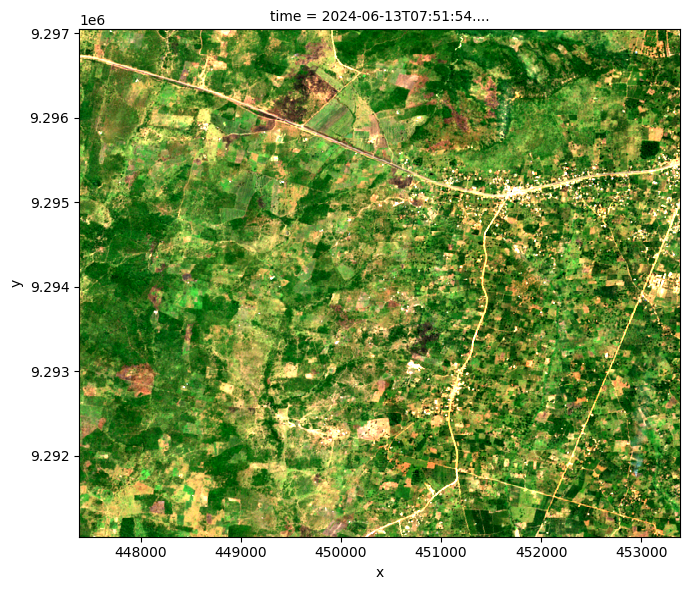

In [125]:
data.plot.imshow(row='time', rgb='band', robust=True, size=6)

In [126]:
import folium

# Create a map centered near the polygon
m = folium.Map(location=[-6.55, 38.8], zoom_start=10)

# Define the polygon coordinates
coords = [
    [38.5513639024837, -6.386527687031872],
    [38.5513639024837, -6.712371750140903],
    [39.035604148587, -6.712371750140903],
    [39.035604148587, -6.386527687031872],
    [38.5513639024837, -6.386527687031872]
]

# Add the polygon
folium.Polygon(
    locations=[list(reversed(c)) for c in coords],  # Reverse to Lat, Lon
    color="blue",
    fill=True,
    fill_color="blue",
    fill_opacity=0.5
).add_to(m)

# Show the map
m.save("polygon_map.html")

In [127]:
src.meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0.0,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS.from_epsg(32737),
 'transform': Affine(10.0, 0.0, 399960.0,
        0.0, -10.0, 9300040.0)}

In [128]:
from rasterio.plot import show
numpy_array = data.values  # Extract NumPy array

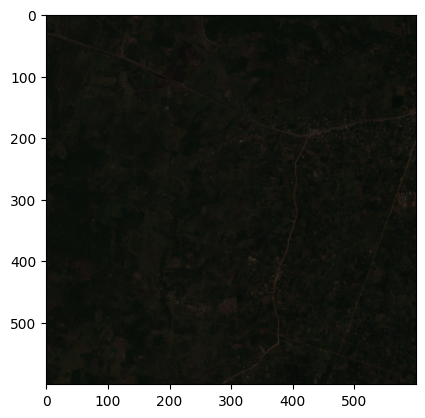

<Axes: >

In [129]:
show(numpy_array)

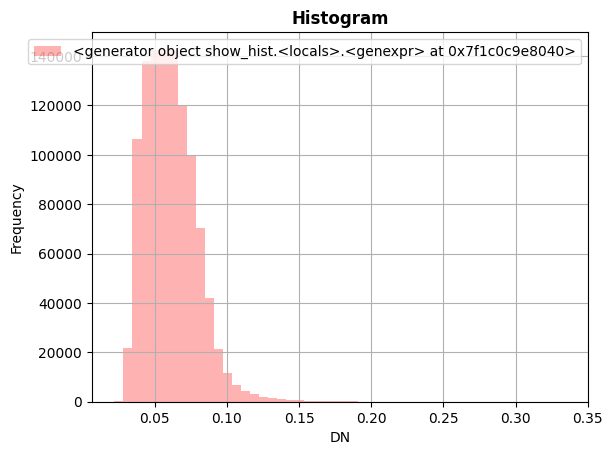

In [133]:
from rasterio.plot import show_hist
show_hist(numpy_array, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title="Histogram")

In [137]:
bands = src.read()
i = 1
for band in bands:
    print(f"band {i}")
    print({
       'min': band.min(),
       'mean': band.mean(),
       'median': np.median(band),
       'max': band.max()})
    i += 1

band 1
{'min': 1116, 'mean': 3778.931206855651, 'median': 3834.0, 'max': 16216}


In [139]:
import numpy as np
np.seterr(divide='ignore', invalid='ignore')

red = src.read(1).astype(float)
nir = src.read(1).astype(float)

ndvi = (nir - red) / (nir+red)